# Pendulum with Damping, Easy Case

Background--Using Turing.jl:

I was using `DiffEqBayes.jl`, but I guess I don't have to anymore:

> Previously, functions in Turing and DifferentialEquations were not inter-composable, so Bayesian inference of differential equations needed to be handled by another package called DiffEqBayes.jl (note that DiffEqBayes works also with CmdStan.jl, Turing.jl, DynamicHMC.jl and ApproxBayes.jl - see the DiffEqBayes docs for more info).

> Nowadays, however, Turing and DifferentialEquations are completely composable and we can just simulate differential equations inside a Turing @model

Source: <https://turinglang.org/v0.24/tutorials/10-bayesian-differential-equations/>

Also:

> We’ll keep it around to make benchmarking against Flux easier, but the tools have evolved to the point that direct use of Turing is probably preferred.

Source: <https://discourse.julialang.org/t/turing-package-s-parameter-estimation-for-diffeq-models/44082/33>

In [1]:
#| output: false
using Turing, DifferentialEquations, StatsPlots, LinearAlgebra, Random

## Generate Data

The true pendulum equation is:

$$
\ddot{\theta} = \frac{g\sin(\theta)}{L} - \lambda\frac{\dot{\theta}}{m}
$$

which with the constraints below is just:

$$
\ddot{\theta} = -3.92\sin(\theta) - 0.2\dot{\theta}
$$

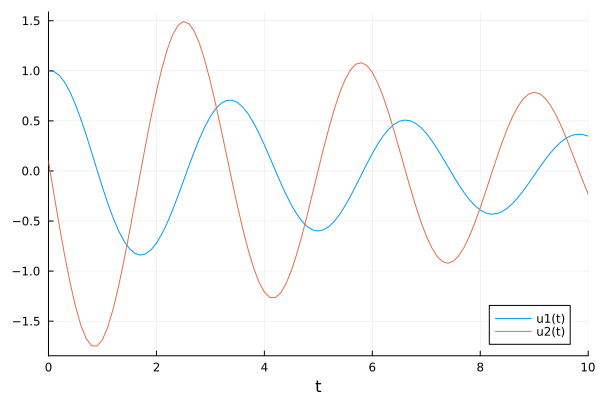

In [2]:

function pendulum(du,u,p,t)
    ω,L = p
    x,y = u
    du[1] = y
    du[2] = - ω*y -(9.8/L)*sin(x)
end


u0 = [1.0,0.1]
tspan = (0.0,10.0)
prob1 = ODEProblem(pendulum,u0,tspan,[0.2,2.5])

# Solve
# prob = ODEProblem(pendulum!, u0, tspan, p)
sol = solve(prob1, Tsit5(); saveat=0.1)

X = Array(sol)
t = sol.t
DX = Array(sol(sol.t,Val{1}))[[2], :]

plot(sol)

### Generate dummy data for estimation

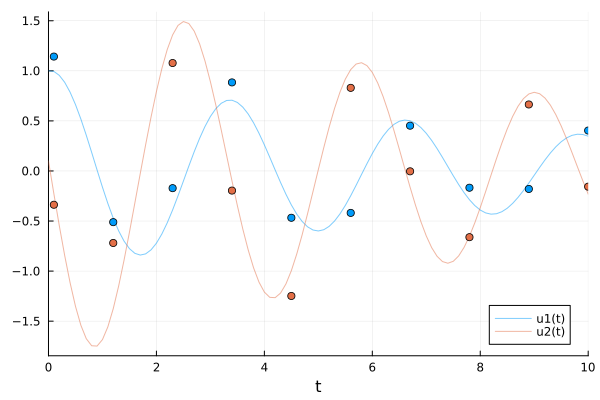

In [3]:
t = collect(range(0.1, stop=10, length=10))

odedata = Array(solve(prob1, saveat=t))
odedata = odedata + 0.2 * randn(size(odedata))
plot(sol; alpha=0.5)
scatter!(t, odedata'; color=[1 2], label="")


## Parameter Estimation


Given $\theta$, $\dot{\theta}$, $sin(\theta)$, and $sin(\dot{\theta})$ as basis functions, find the correct parameters. Since the actual DE is:

$$
\ddot{\theta} = \frac{g\sin(\theta)}{L} - \lambda\frac{\dot{\theta}}{m}
$$

The values for this setup should be [0.0, -0.2, -3.92, 0.0]. This is a fairly simple case. Two methods will be tested:

1. Using Normal(0, 1) priors
2. Using Finnish Horseshoe priors

### Using Normal Priors

In [4]:
#| output: false
function pendulumSindy!(du, u, p, t)
    # u = [theta, theta_d]

    # theta_d
    du[1] = u[2]

    # theta_dd
    du[2] = p[1]*u[1] + p[2]*u[2] + p[3]*sin(u[1]) + p[4]*sin(u[2])
end

sindyProb = ODEProblem(pendulumSindy!, u0, tspan, [0.0, 0.0, 0.0, 0.0])

ODEProblem with uType Vector{Float64} and tType Float64. In-place: true
timespan: (0.0, 10.0)
u0: 2-element Vector{Float64}:
 1.0
 0.1

In [14]:
#| output: false
@model function fitPend(data, ::Type{T} = Float64) where {T <: Real}
    # Prior distributions
    priors = [Normal(0.0, 1.0) for _ in 1:4]
    # priors = [Normal(0.0, 1.0) for _ in 1:2]
    # priors = [truncated(Normal(0.1,1.0), lower = 0.0), truncated(Normal(3.0,1.0), lower = 0.0)]
    theta = Vector{T}(undef, length(priors))
    syms = [Turing.@varname(theta[i]) for i in 1:length(priors)]
    for i in 1:length(priors)
        theta[i] ~ NamedDist(priors[i], syms[i])
    end

    σ ~ InverseGamma(2, 3)

    p = convert.(T, theta)
    u0 = convert.(T, sindyProb.u0)
    
    # Simulate model
    predicted = solve(sindyProb, Tsit5(); p=p, saveat=t)
    predicted_dense = solve(sindyProb, Tsit5(); p=p)
    failure = size(predicted, 2) < length(t)

    if failure
        
        # println("size = $(size(predicted, 2))")
        # println("p = $p")
        Turing.@addlogprob! -Inf
        return
    end
    # for i in 1:length(t)
    #     data[:, i] ~ MvNormal(predicted[:, i], σ^2 * I)  # Equivalent to separate univariate normal distributions
    # end

    # return nothing
    return (; predicted_dense)
end


fitPend (generic function with 3 methods)

In [6]:
#| output: false

model = fitPend(odedata)

chain = sample(model, NUTS(0.65; init_ϵ=0.01), MCMCSerial(), 1_000, 1; progress=true)

Sampling (Chain 1 of 1)   0%|█                          |  ETA: N/A
Sampling (Chain 1 of 1)   0%|█                          |  ETA: 2:34:47
Sampling (Chain 1 of 1)   1%|█                          |  ETA: 1:17:17
Sampling (Chain 1 of 1)   1%|█                          |  ETA: 0:51:22
Sampling (Chain 1 of 1)   2%|█                          |  ETA: 0:38:29
Sampling (Chain 1 of 1)   2%|█                          |  ETA: 0:30:41
Sampling (Chain 1 of 1)   3%|█                          |  ETA: 0:25:31
Sampling (Chain 1 of 1)   3%|█                          |  ETA: 0:21:48
Sampling (Chain 1 of 1)   4%|██                         |  ETA: 0:19:00
Sampling (Chain 1 of 1)   4%|██                         |  ETA: 0:16:51
Sampling (Chain 1 of 1)   5%|██                         |  ETA: 0:15:08
Sampling (Chain 1 of 1)   5%|██                         |  ETA: 0:13:45
Sampling (Chain 1 of 1)   6%|██                         |  ETA: 0:12:36
Sampling (Chain 1 of 1)   6%|██                         |  ETA: 0:11

Sampling (Chain 1 of 1)  47%|█████████████              |  ETA: 0:01:01
Sampling (Chain 1 of 1)  47%|█████████████              |  ETA: 0:01:00
Sampling (Chain 1 of 1)  48%|█████████████              |  ETA: 0:00:59
Sampling (Chain 1 of 1)  48%|█████████████              |  ETA: 0:00:58
Sampling (Chain 1 of 1)  49%|██████████████             |  ETA: 0:00:57
Sampling (Chain 1 of 1)  49%|██████████████             |  ETA: 0:00:56
Sampling (Chain 1 of 1)  49%|██████████████             |  ETA: 0:00:55
Sampling (Chain 1 of 1)  50%|██████████████             |  ETA: 0:00:54
Sampling (Chain 1 of 1)  50%|██████████████             |  ETA: 0:00:53
Sampling (Chain 1 of 1)  51%|██████████████             |  ETA: 0:00:53
Sampling (Chain 1 of 1)  51%|██████████████             |  ETA: 0:00:52
Sampling (Chain 1 of 1)  52%|██████████████             |  ETA: 0:00:51
Sampling (Chain 1 of 1)  52%|███████████████            |  ETA: 0:00:50
Sampling (Chain 1 of 1)  53%|███████████████            |  ETA: 

Sampling (Chain 1 of 1)  93%|██████████████████████████ |  ETA: 0:00:05
Sampling (Chain 1 of 1)  94%|██████████████████████████ |  ETA: 0:00:04
Sampling (Chain 1 of 1)  94%|██████████████████████████ |  ETA: 0:00:04
Sampling (Chain 1 of 1)  95%|██████████████████████████ |  ETA: 0:00:04
Sampling (Chain 1 of 1)  95%|██████████████████████████ |  ETA: 0:00:03
Sampling (Chain 1 of 1)  96%|██████████████████████████ |  ETA: 0:00:03
Sampling (Chain 1 of 1)  96%|██████████████████████████ |  ETA: 0:00:03
Sampling (Chain 1 of 1)  97%|███████████████████████████|  ETA: 0:00:02
Sampling (Chain 1 of 1)  97%|███████████████████████████|  ETA: 0:00:02
Sampling (Chain 1 of 1)  98%|███████████████████████████|  ETA: 0:00:02
Sampling (Chain 1 of 1)  98%|███████████████████████████|  ETA: 0:00:01
Sampling (Chain 1 of 1)  98%|███████████████████████████|  ETA: 0:00:01
Sampling (Chain 1 of 1)  99%|███████████████████████████|  ETA: 0:00:01
Sampling (Chain 1 of 1)  99%|███████████████████████████|  ETA: 

Chains MCMC chain (1000×17×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 68.22 seconds
Compute duration  = 68.22 seconds
parameters        = theta[1], theta[2], theta[3], theta[4], σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std   naive_se      mcse        ess      rhat   e ⋯
      Symbol   Float64   Float64    Float64   Float64    Float64   Float64     ⋯

    theta[1]   -1.9234    0.6779     0.0214    0.0386   380.9785    1.0046     ⋯
    theta[2]   -0.6333    0.4963     0.0157    0.0308   246.5007    1.0083     ⋯
    theta[3]   -1.7783    0.7223     0.0228    0.0414   374.4745    1.0045     ⋯
    theta[4]    0.4939    0.6217     0.0197    0.0390   238.9365    1.0086     ⋯
           σ    0.2920    0.057

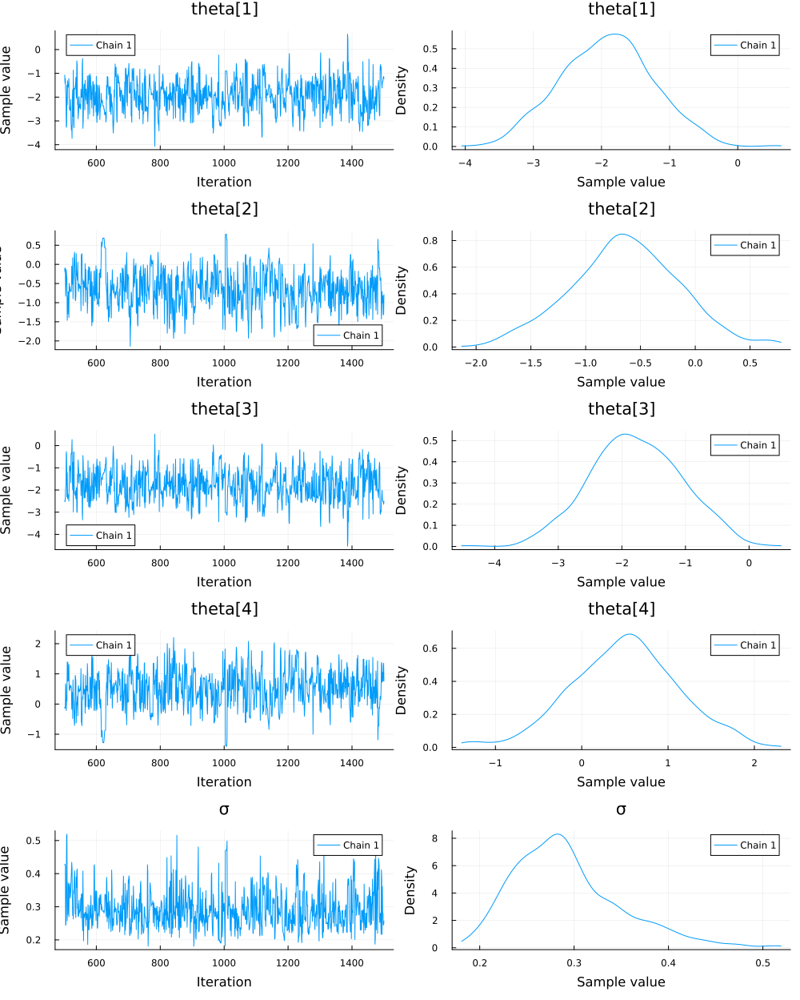

In [7]:
#| output: false
plot(chain, legend=true)


In [15]:
#| output: false
using DataFramesMeta

# finnish_chain = generated_quantities(fitPendHorseshoe, chain3)
finnish_chain = generated_quantities(model, MCMCChains.get_sections(chain, :parameters))
finnish_df = reduce(vcat, DataFrame(finnish_chain[:, i]) for i in 1:size(finnish_chain, 2))


1000×1 DataFrame
  Row │ predicted_dense                   
      │ ODESolution…                      
──────┼───────────────────────────────────
    1 │ ODESolution{Float64, 2, Vector{V…
    2 │ ODESolution{Float64, 2, Vector{V…
    3 │ ODESolution{Float64, 2, Vector{V…
    4 │ ODESolution{Float64, 2, Vector{V…
    5 │ ODESolution{Float64, 2, Vector{V…
    6 │ ODESolution{Float64, 2, Vector{V…
    7 │ ODESolution{Float64, 2, Vector{V…
    8 │ ODESolution{Float64, 2, Vector{V…
  ⋮   │                 ⋮
  994 │ ODESolution{Float64, 2, Vector{V…
  995 │ ODESolution{Float64, 2, Vector{V…
  996 │ ODESolution{Float64, 2, Vector{V…
  997 │ ODESolution{Float64, 2, Vector{V…
  998 │ ODESolution{Float64, 2, Vector{V…
  999 │ ODESolution{Float64, 2, Vector{V…
 1000 │ ODESolution{Float64, 2, Vector{V…
                          985 rows omitted

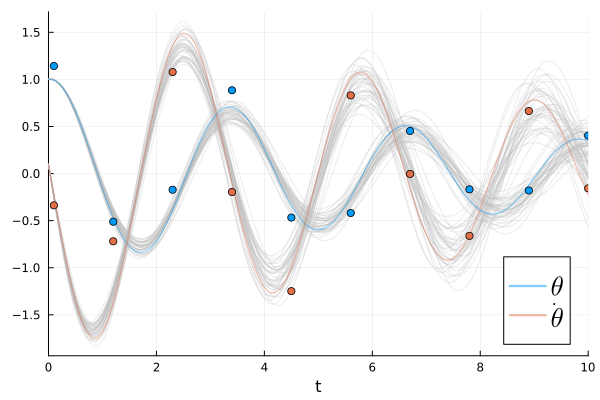

In [16]:
#| output: false
plot(; legendfontsize=18)
all_sol = finnish_df.predicted_dense
for i in 1:25:size(finnish_df, 1)
# for i in 1:5
    plot!(all_sol[i]; alpha=0.3, color="#BBBBBB", label="")
end

# Plot simulations and noise observations
plot!(sol; alpha=0.5, linewidth=1, label=["\$\\theta\$" "\$\\dot{\\theta}\$"])
scatter!(t, odedata'; color=[1 2], label="")


Solution should be: `[0, -0.2, -3.92, 0]`. 

In [ ]:
#| echo: false
#| output: false

# @model function fitPendR2D2(data, ::Type{T} = Float64) where {T <: Real}
#     # Prior distributions
#     σ0 ~ InverseGamma(2, 3)
#     J = 4
#     mean_R2 = 0.5
#     prec_R2 = 10000
#     cons_D2 = 1

#     z ~ filldist(Normal(), J)
#     σ ~ Exponential(1) # Errors
#     R2 ~ Beta(mean_R2 * prec_R2, (1 - mean_R2) * prec_R2) # R2 parameter
#     ϕ ~ Dirichlet(J, cons_D2)
#     τ2 = σ^2 * R2 / (1 - R2)

#     priors = z .* sqrt.(ϕ * τ2)
#     # println(priors)
#     # theta = Vector{T}(undef, length(priors))
#     # syms = [Turing.@varname(theta[i]) for i in 1:length(priors)]
#     # for i in 1:length(priors)
#     #     theta[i] ~ NamedDist(priors[i], syms[i])
#     # end

#     p = convert.(T, priors)
#     u0 = convert.(T, sindyProb.u0)
    
#     # Simulate model
#     # predicted = solve(prob, TRBDF2(); p=p, saveat=0.1)
#     # if length(t) != 30
#     #     print("t = $t")
#     # end
#     predicted = solve(sindyProb, Tsit5(); p=p, saveat=t)#, saveat=0.1)
#     failure = size(predicted, 2) < length(t)

#     if failure
#         println("size = $(size(predicted, 2))")
#         println("p = $p")
#         println("R2 = $R2")
#         println("σ = $σ")
#         println("σ0 = $σ0")
#     end
#     # print(size(predicted))
#     # Observations
#     # norm1 ~ MvNormal(zeros(T, length(t)), 1.0 * I)
#     # norm2 ~ MvNormal(T, zeros(length(t)), 1.0 * I)
#     # println(norm1)
#     for i in 1:length(t)
#         # println(data[2, i])
#         # println(predicted[2, i])
#         # println(norm1[i])
#         # data[1, i] = predicted[1, i] + σ^2 * norm1[i]
#         # data[2, i] = predicted[2, i] + σ^2 * norm2[i]
#         data[:, i] ~ MvNormal(predicted[:, i], σ0^2 * I)
#     end

#     # println("sigma: $σ")
#     # println("a: $a")
#     # println("b: $b")
#     # println("c: $c")
#     # println("d: $d")

#     return nothing
# end


In [17]:
#| output: false
@model function fitPendHorseshoe(data, ::Type{T} = Float64) where {T <: Real}
    # Prior distributions
    σ0 ~ InverseGamma(2, 3)
    J = 4
    ν_local = 3
    ν_global = 0.1
    τ₀=1
    slab_df=4
    slab_scale=2

    # Priors
    z ~ MvNormal(zeros(J), I) # Standard Normal for Coefs
    α ~ TDist(3) # Intercept
    σ ~ Exponential(1) # Errors
    λ ~ filldist(truncated(TDist(ν_local); lower=0), J)  # local shrinkage
    τ ~ (τ₀ * σ) * truncated(TDist(ν_global); lower=0)  # global shrinkage
    c_aux ~ InverseGamma(0.5 * slab_df, 0.5 * slab_df)
    
    # Transformations
    c = slab_scale * sqrt(c_aux)
    λtilde = λ ./ hypot.(1, (τ / c) .* λ)
    β = τ .* z .* λtilde # Regression coefficients

    p = convert.(T, β)
    u0 = convert.(T, sindyProb.u0)
    
    # Simulate model
    predicted = solve(sindyProb, Tsit5(); p=p, saveat=t)
    predicted_dense = solve(sindyProb, Tsit5(); p=p)
    failure = size(predicted, 2) < length(t)

    if failure
        Turing.@addlogprob! -Inf
        return

    end
    # Observations
    # for i in 1:length(t)
    #     data[:, i] ~ MvNormal(predicted[:, i], σ0^2 * I)
    # end

    # return nothing
    return (; τ, σ, λ, λtilde, z, c, c_aux, α, β, predicted_dense)
end


fitPendHorseshoe (generic function with 3 methods)

In [18]:
#| output: false

modelHorse = fitPendHorseshoe(odedata)

# chain3 = sample(modelHorse, NUTS(0.65; init_ϵ=0.01), MCMCSerial(), 1000, 2; progress=true)


DynamicPPL.Model{typeof(fitPendHorseshoe), (:data, Symbol("##arg#411")), (Symbol("##arg#411"),), (), Tuple{Matrix{Float64}, DataType}, Tuple{DataType}, DynamicPPL.DefaultContext}(fitPendHorseshoe, (data = [1.1420858001878962 -0.5113676991668887 … -0.17991058213233407 0.4034861008285494; -0.3375246269783261 -0.7193093360018814 … 0.6638641541774368 -0.15694245497305037], var"##arg#411" = Float64), (var"##arg#411" = Float64,), DynamicPPL.DefaultContext())

In [19]:
#| output: false
# Save/read samples
path = "../Data/chain-pend-hs-easy.jls"
if @isdefined chain3
    write(path, chain3)
else
    chain3 = read(path, Chains)
end

Chains MCMC chain (1000×25×2 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 2
Samples per chain = 1000
Wall duration     = 182.88 seconds
Compute duration  = 182.32 seconds
parameters        = σ0, z[1], z[2], z[3], z[4], α, σ, λ[1], λ[2], λ[3], λ[4], τ, c_aux
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters                                 mean                              ⋯
      Symbol                              Float64                              ⋯

          σ0                               0.3220                              ⋯
        z[1]                              -0.9797                              ⋯
        z[2]                              -0.3796                              ⋯
        z[3]                              -0.8420                              ⋯
    

In [20]:
#| output: false
using DataFramesMeta

# finnish_chain = generated_quantities(fitPendHorseshoe, chain3)
finnish_chain = generated_quantities(modelHorse, MCMCChains.get_sections(chain3, :parameters))
finnish_df = reduce(vcat, DataFrame(finnish_chain[:, i]) for i in 1:size(finnish_chain, 2))
@chain finnish_df begin
  @rselect @astable :β = :z * :τ .* :λtilde
  @combine :β_mean = mean(:β)
end

Row,β_mean
,Float64
1,-1.96733
2,-0.84643
3,-1.75004
4,0.609897


In [21]:
#| output: false
using DataFrames

# Extract coefficient samples

# Clean data from generated quantites
var_str = [
    "\$\\theta\$",
    "\$\\dot{\\theta}\$",
    "\$sin(\\theta)\$",
    "\$sin(\\dot{\\theta})\$",
]
samples = size(finnish_chain, 1)
beta1 = DataFrame([finnish_chain[i, 1][:β] for i in 1:samples], :auto)
beta1[!,:var] = var_str
beta1[!,:chain] = [1 for _ in 1:size(beta1)[1]]
beta1 = DataFrames.stack(beta1, 1:samples)
beta2 = DataFrame([finnish_chain[i, 2][:β] for i in 1:samples], :auto)
beta2[!,:var] = var_str
beta2[!,:chain] = [2 for _ in 1:size(beta2)[1]]
beta2 = DataFrames.stack(beta2, 1:samples)
beta = vcat(beta1, beta2)
beta

Row,var,chain,variable,value
,String,Int64,String,Float64
1,$\\theta$,1,x1,-1.18649
2,$\\dot{\\theta}$,1,x1,0.526456
3,$sin(\\theta)$,1,x1,-2.60118
4,$sin(\\dot{\\theta})$,1,x1,-0.955967
5,$\\theta$,1,x2,-0.969632
6,$\\dot{\\theta}$,1,x2,0.447675
7,$sin(\\theta)$,1,x2,-2.86248
8,$sin(\\dot{\\theta})$,1,x2,-1.07126
9,$\\theta$,1,x3,-0.911453


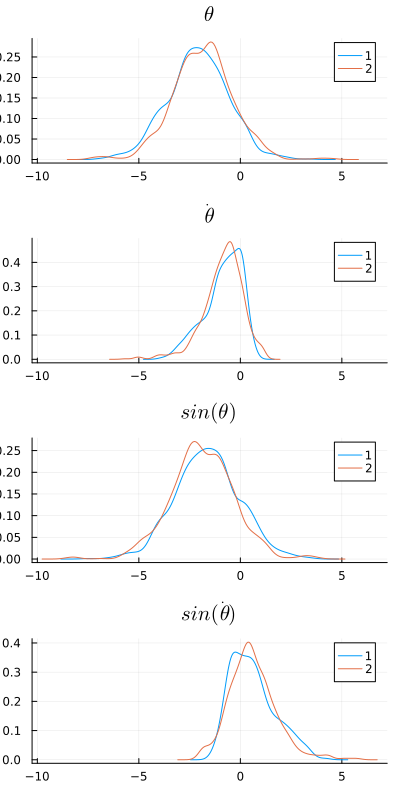

In [22]:
#| output: false
gdf = groupby(beta, :var)
plot_list = []
for ((k,), v) in pairs(gdf)
    push!(plot_list, @df v density(:value, group=(:chain), title=k))
end

plot(plot_list..., layout=(length(plot_list), 1), size=(400, 200 * length(plot_list)), link = :x)
    


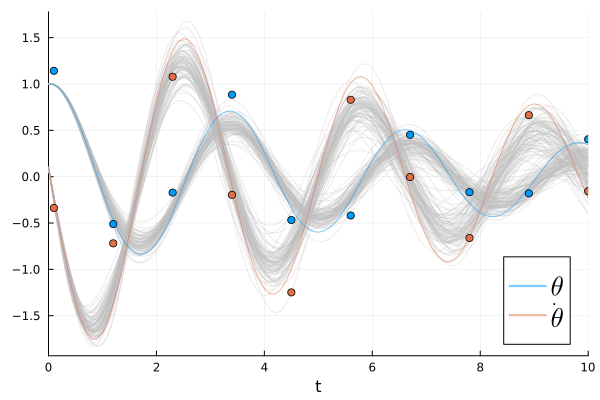

In [23]:
#| output: false
plot(; legendfontsize=18)
all_sol = finnish_df.predicted_dense
for i in 1:25:size(finnish_df, 1)
    plot!(all_sol[i]; alpha=0.3, color="#BBBBBB", label="")
end

# Plot simulations and noise observations
plot!(sol; alpha=0.5, linewidth=1, label=["\$\\theta\$" "\$\\dot{\\theta}\$"])
scatter!(t, odedata'; color=[1 2], label="")
